# Data science Project (University ranking)

<div class="alert alert-block alert-info"><b> Import libraries </div>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import pycountry
import pycountry_convert as pc
from mpl_toolkits.basemap import Basemap
from geopy.geocoders import Nominatim
from random import randint

import warnings
warnings.filterwarnings('ignore')

<div class="alert alert-block alert-info"> <b> Import Dataset </div>

In [2]:
# import file
data = pd.read_csv ('uni_dataset.csv', encoding= 'unicode_escape')
data

,World Rank,Institution,Location,National Rank,Quality of Education,Alumni Employment,Quality of Faculty,Research Output,Quality Publications,Influence,Citations,Score
0,1,Harvard University,USA,1,2,1,1,1,1,1,1,100.0
1,2,Stanford University,USA,2,10,3,2,10,4,3,2,96.7
2,3,Massachusetts Institute of Technology,USA,3,3,11,3,30,15,2,6,95.1
3,4,University of Cambridge,United Kingdom,1,5,19,6,12,8,6,19,94.0
4,5,University of Oxford,United Kingdom,2,9,25,10,9,5,7,4,93.2
...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,Aga Khan University,Pakistan,3,-,> 1000,-,> 1000,> 1000,464,673,69.8
996,997,University of Calcutta,India,17,353,716,296,798,966,> 1000,> 1000,69.8
997,998,K?chi University,Japan,56,-,> 1000,-,> 1000,> 1000,811,673,69.8
998,999,Soonchunhyang University,South Korea,35,-,> 1000,-,881,> 1000,> 1000,898,69.8


In [3]:
# creat dataframe
df = pd.DataFrame (data)
df

,World Rank,Institution,Location,National Rank,Quality of Education,Alumni Employment,Quality of Faculty,Research Output,Quality Publications,Influence,Citations,Score
0,1,Harvard University,USA,1,2,1,1,1,1,1,1,100.0
1,2,Stanford University,USA,2,10,3,2,10,4,3,2,96.7
2,3,Massachusetts Institute of Technology,USA,3,3,11,3,30,15,2,6,95.1
3,4,University of Cambridge,United Kingdom,1,5,19,6,12,8,6,19,94.0
4,5,University of Oxford,United Kingdom,2,9,25,10,9,5,7,4,93.2
...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,Aga Khan University,Pakistan,3,-,> 1000,-,> 1000,> 1000,464,673,69.8
996,997,University of Calcutta,India,17,353,716,296,798,966,> 1000,> 1000,69.8
997,998,K?chi University,Japan,56,-,> 1000,-,> 1000,> 1000,811,673,69.8
998,999,Soonchunhyang University,South Korea,35,-,> 1000,-,881,> 1000,> 1000,898,69.8


<div class="alert alert-block alert-info"> <b> Preprocessing </div>

In [4]:
df.columns.tolist()

['World Rank',
 'Institution',
 'Location',
 'National Rank',
 'Quality\xa0of Education',
 'Alumni Employment',
 'Quality\xa0of Faculty',
 'Research Output',
 'Quality Publications',
 'Influence',
 'Citations',
 'Score']

In [5]:
new_columns_names = ["Quality of Education", "Quality of Faculty"]
dic = {"Quality\xa0of Education": new_columns_names[0], "Quality\xa0of Faculty": new_columns_names[1]}
df = df.rename(columns=dic)

In [6]:
df.columns.tolist()

['World Rank',
 'Institution',
 'Location',
 'National Rank',
 'Quality of Education',
 'Alumni Employment',
 'Quality of Faculty',
 'Research Output',
 'Quality Publications',
 'Influence',
 'Citations',
 'Score']

In [7]:
# information about dataframe
df.describe(include="all")

,World Rank,Institution,Location,National Rank,Quality of Education,Alumni Employment,Quality of Faculty,Research Output,Quality Publications,Influence,Citations,Score
count,1000.000000,1000,1000,1000.00000,1000,1000,1000,1000,1000,1000,1000,1000.000000
unique,NaN,1000,61,NaN,404,492,221,905,892,830,75,NaN
top,NaN,Harvard University,USA,NaN,-,> 1000,-,> 1000,> 1000,> 1000,898,NaN
freq,NaN,1,213,NaN,597,509,731,77,51,171,129,NaN
mean,500.500000,NaN,NaN,40.02300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,75.034300
std,288.819436,NaN,NaN,49.22871,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.670858
min,1.000000,NaN,NaN,1.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,69.800000
25%,250.750000,NaN,NaN,6.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71.500000
50%,500.500000,NaN,NaN,21.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,73.750000
75%,750.250000,NaN,NaN,51.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,77.300000


In [8]:
#check for "-" values
for col in df.columns :
    print(col,' : ','-' in set(df[col]))


World Rank  :  False
Institution  :  False
Location  :  False
National Rank  :  False
Quality of Education  :  True
Alumni Employment  :  False
Quality of Faculty  :  True
Research Output  :  False
Quality Publications  :  False
Influence  :  False
Citations  :  False
Score  :  False


In [9]:
#a closer look at the values - 
QE = df[df["Quality of Education"]=="-"]
print("Max Score in dataframe : ",QE.Score.max())
print("Min Score in dataframe : ",QE.Score.min())
print("Max World Rank in dataframe : ",QE["World Rank"].max())
print("Min World Rank in dataframe : ",QE["World Rank"].min())
QE

Max Score in dataframe :  87.7
Min Score in dataframe :  69.8
Max World Rank in dataframe :  1000
Min World Rank in dataframe :  22


,World Rank,Institution,Location,National Rank,Quality of Education,Alumni Employment,Quality of Faculty,Research Output,Quality Publications,Influence,Citations,Score
21,22,"University of California, San Francisco",USA,17,-,> 1000,13,45,23,8,17,87.7
59,60,Seoul National University,South Korea,1,-,20,-,19,39,146,129,83.7
79,80,Emory University,USA,47,-,197,164,101,66,55,63,82.5
88,89,University of Texas MD Anderson Cancer Center,USA,49,-,> 1000,91,158,104,70,66,82.0
93,94,Baylor College of Medicine,USA,51,-,> 1000,141,161,118,38,53,81.8
...,...,...,...,...,...,...,...,...,...,...,...,...
994,995,University of Macau,Macau,1,-,512,-,883,816,> 1000,> 1000,69.8
995,996,Aga Khan University,Pakistan,3,-,> 1000,-,> 1000,> 1000,464,673,69.8
997,998,K?chi University,Japan,56,-,> 1000,-,> 1000,> 1000,811,673,69.8
998,999,Soonchunhyang University,South Korea,35,-,> 1000,-,881,> 1000,> 1000,898,69.8


In [10]:
dfQualityF = df[df["Quality of Faculty"]=="-"]
print("Max Score in dataframe : ",dfQualityF.Score.max())
print("Min Score in dataframe : ",dfQualityF.Score.min())
print("Max World Rank in dataframe : ",dfQualityF["World Rank"].max())
print("Min World Rank in dataframe : ",dfQualityF["World Rank"].min())
dfQualityF

Max Score in dataframe :  83.7
Min Score in dataframe :  69.8
Max World Rank in dataframe :  1000
Min World Rank in dataframe :  60


,World Rank,Institution,Location,National Rank,Quality of Education,Alumni Employment,Quality of Faculty,Research Output,Quality Publications,Influence,Citations,Score
59,60,Seoul National University,South Korea,1,-,20,-,19,39,146,129,83.7
72,73,University of Pittsburgh,USA,43,187,233,-,34,25,47,18,82.9
91,92,Peking University,China,1,340,67,-,23,38,88,167,81.9
97,98,Tsinghua University,China,2,586,109,-,22,41,96,108,81.6
102,103,National University of Singapore,Singapore,1,-,148,-,38,32,94,85,81.4
...,...,...,...,...,...,...,...,...,...,...,...,...
994,995,University of Macau,Macau,1,-,512,-,883,816,> 1000,> 1000,69.8
995,996,Aga Khan University,Pakistan,3,-,> 1000,-,> 1000,> 1000,464,673,69.8
997,998,K?chi University,Japan,56,-,> 1000,-,> 1000,> 1000,811,673,69.8
998,999,Soonchunhyang University,South Korea,35,-,> 1000,-,881,> 1000,> 1000,898,69.8


In [11]:
df[(df["Quality of Faculty"]=="-") &(df["Quality of Education"]=="-")]

,World Rank,Institution,Location,National Rank,Quality of Education,Alumni Employment,Quality of Faculty,Research Output,Quality Publications,Influence,Citations,Score
59,60,Seoul National University,South Korea,1,-,20,-,19,39,146,129,83.7
102,103,National University of Singapore,Singapore,1,-,148,-,38,32,94,85,81.4
106,107,KU Leuven,Belgium,2,-,429,-,48,47,84,66,81.2
126,127,VU University Amsterdam,Netherlands,6,-,984,-,91,71,132,44,80.5
152,153,Icahn School of Medicine at Mount Sinai,USA,65,-,> 1000,-,202,145,59,101,79.6
...,...,...,...,...,...,...,...,...,...,...,...,...
994,995,University of Macau,Macau,1,-,512,-,883,816,> 1000,> 1000,69.8
995,996,Aga Khan University,Pakistan,3,-,> 1000,-,> 1000,> 1000,464,673,69.8
997,998,K?chi University,Japan,56,-,> 1000,-,> 1000,> 1000,811,673,69.8
998,999,Soonchunhyang University,South Korea,35,-,> 1000,-,881,> 1000,> 1000,898,69.8


After various investigations, we come to the conclusion that the best way to fill in dashed values is to use one greater than the largest number in that column.

In [12]:
#Change > 1000 to 1001
df.replace("> 1000",'1001',inplace=True)
#Chnage - to max+1 
df["Quality of Education"].replace('-','667',inplace=True)
df["Quality of Faculty"].replace('-','304',inplace=True)

In [13]:
for col in df.drop(columns=['Institution','Location','Score']):#Drop the columns that we don't want to retype
    df[col]=df[col].astype(np.int64)

###### 

In [14]:
df.shape

(1000, 12)

In [15]:
#Remove missing values
df.dropna()

,World Rank,Institution,Location,National Rank,Quality of Education,Alumni Employment,Quality of Faculty,Research Output,Quality Publications,Influence,Citations,Score
0,1,Harvard University,USA,1,2,1,1,1,1,1,1,100.0
1,2,Stanford University,USA,2,10,3,2,10,4,3,2,96.7
2,3,Massachusetts Institute of Technology,USA,3,3,11,3,30,15,2,6,95.1
3,4,University of Cambridge,United Kingdom,1,5,19,6,12,8,6,19,94.0
4,5,University of Oxford,United Kingdom,2,9,25,10,9,5,7,4,93.2
...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,Aga Khan University,Pakistan,3,667,1001,304,1001,1001,464,673,69.8
996,997,University of Calcutta,India,17,353,716,296,798,966,1001,1001,69.8
997,998,K?chi University,Japan,56,667,1001,304,1001,1001,811,673,69.8
998,999,Soonchunhyang University,South Korea,35,667,1001,304,881,1001,1001,898,69.8


In [16]:
# Add name of continent 
df['Continent']=np.NaN
for i in range(len(df)):
    country_code = pc.country_name_to_country_alpha2(df.Location.iloc[i], cn_name_format="default")
    df['Continent'].iloc[i] = pc.country_alpha2_to_continent_code(country_code)

In [17]:
df.Continent.replace ( {'NA': 'North America','SA': 'South America', 'AS': 'Asia','OC': 'Australia','AF': 'Africa',
                      'EU': 'Europe'},inplace=True)

In [18]:
# Add iso name for plot
df['Country']= np.NaN

def alpha3(input):
    
    input_countries = [input]

    countries = {}
    for country in pycountry.countries:
        countries[country.name] = country.alpha_3
        for country in input_countries:
            codes = countries.get(country, input) 

    return(codes)  

for i in range(len(df)):
    df["Country"].iloc[i] = alpha3(df.Location.iloc[i])
    


In [19]:
df['Country'].replace({"South Korea":"KOR", "Taiwan":"TWN","Russia":"RUS",
                    "Czech Republic":"CZE","Iran":"IRN","Slovak Republic":"SVK","Macau":"MAC"},inplace=True)

In [21]:
# Add longitude and lattitude
df["Longitude"]=np.NaN
df["Latitude"]=np.NaN
geolocator = Nominatim(user_agent="koosha")
for i in range(len(df)):
    try:
        Loc = df.Location.iloc[i]+","+df.Institution.iloc[i]
        address=geolocator.geocode(Loc)
        df["Latitude"].iloc[i]=address.latitude
        df["Longitude"].iloc[i]=address.longitude
    
    except:
        Loc= df.Location.iloc[i]
        address=geolocator.geocode(Loc)
        df["Latitude"].iloc[i]=address.latitude
        df["Longitude"].iloc[i]=address.longitude


In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   World Rank            1000 non-null   int64  
 1   Institution           1000 non-null   object 
 2   Location              1000 non-null   object 
 3   National Rank         1000 non-null   int64  
 4   Quality of Education  1000 non-null   int64  
 5   Alumni Employment     1000 non-null   int64  
 6   Quality of Faculty    1000 non-null   int64  
 7   Research Output       1000 non-null   int64  
 8   Quality Publications  1000 non-null   int64  
 9   Influence             1000 non-null   int64  
 10  Citations             1000 non-null   int64  
 11  Score                 1000 non-null   float64
 12  Continent             1000 non-null   object 
 13  Country               1000 non-null   object 
 14  Longitude             1000 non-null   float64
 15  Latitude              

In [23]:
df.isnull().sum()

World Rank              0
Institution             0
Location                0
National Rank           0
Quality of Education    0
Alumni Employment       0
Quality of Faculty      0
Research Output         0
Quality Publications    0
Influence               0
Citations               0
Score                   0
Continent               0
Country                 0
Longitude               0
Latitude                0
dtype: int64

In [24]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
World Rank,1000.0,NaN,NaN,NaN,500.5,288.819436,1.0,250.75,500.5,750.25,1000.0
Institution,1000,1000,Harvard University,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Location,1000,61,USA,213,NaN,NaN,NaN,NaN,NaN,NaN,NaN
National Rank,1000.0,NaN,NaN,NaN,40.023,49.22871,1.0,6.0,21.0,51.0,213.0
Quality of Education,1000.0,NaN,NaN,NaN,528.532,208.781322,1.0,405.75,667.0,667.0,667.0
Alumni Employment,1000.0,NaN,NaN,NaN,726.528,343.686144,1.0,425.75,1001.0,1001.0,1001.0
Quality of Faculty,1000.0,NaN,NaN,NaN,261.18,84.233419,1.0,282.75,304.0,304.0,304.0
Research Output,1000.0,NaN,NaN,NaN,508.454,300.080433,1.0,250.75,500.5,754.25,1001.0
Quality Publications,1000.0,NaN,NaN,NaN,503.003,292.854863,1.0,250.75,500.5,750.25,1001.0
Influence,1000.0,NaN,NaN,NaN,529.156,322.419239,1.0,250.75,502.5,814.75,1001.0


In [25]:
df

,World Rank,Institution,Location,National Rank,Quality of Education,Alumni Employment,Quality of Faculty,Research Output,Quality Publications,Influence,Citations,Score,Continent,Country,Longitude,Latitude
0,1,Harvard University,USA,1,2,1,1,1,1,1,1,100.0,North America,USA,-71.126782,42.367909
1,2,Stanford University,USA,2,10,3,2,10,4,3,2,96.7,North America,USA,-122.169365,37.431314
2,3,Massachusetts Institute of Technology,USA,3,3,11,3,30,15,2,6,95.1,North America,USA,-71.096627,42.358253
3,4,University of Cambridge,United Kingdom,1,5,19,6,12,8,6,19,94.0,Europe,GBR,0.092005,52.210946
4,5,University of Oxford,United Kingdom,2,9,25,10,9,5,7,4,93.2,Europe,GBR,-1.255668,51.758708
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,Aga Khan University,Pakistan,3,667,1001,304,1001,1001,464,673,69.8,Asia,PAK,67.062022,24.923236
996,997,University of Calcutta,India,17,353,716,296,798,966,1001,1001,69.8,Asia,IND,88.344753,22.484733
997,998,K?chi University,Japan,56,667,1001,304,1001,1001,811,673,69.8,Asia,JPN,139.239418,36.574844
998,999,Soonchunhyang University,South Korea,35,667,1001,304,881,1001,1001,898,69.8,Asia,KOR,126.931634,36.769988


In [26]:
col = df.pop('Score')
df.insert(len(df.columns), 'Score', col)

<div class="alert alert-block alert-info"> <b> Visualization </div>

In [27]:
df

,World Rank,Institution,Location,National Rank,Quality of Education,Alumni Employment,Quality of Faculty,Research Output,Quality Publications,Influence,Citations,Continent,Country,Longitude,Latitude,Score
0,1,Harvard University,USA,1,2,1,1,1,1,1,1,North America,USA,-71.126782,42.367909,100.0
1,2,Stanford University,USA,2,10,3,2,10,4,3,2,North America,USA,-122.169365,37.431314,96.7
2,3,Massachusetts Institute of Technology,USA,3,3,11,3,30,15,2,6,North America,USA,-71.096627,42.358253,95.1
3,4,University of Cambridge,United Kingdom,1,5,19,6,12,8,6,19,Europe,GBR,0.092005,52.210946,94.0
4,5,University of Oxford,United Kingdom,2,9,25,10,9,5,7,4,Europe,GBR,-1.255668,51.758708,93.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,Aga Khan University,Pakistan,3,667,1001,304,1001,1001,464,673,Asia,PAK,67.062022,24.923236,69.8
996,997,University of Calcutta,India,17,353,716,296,798,966,1001,1001,Asia,IND,88.344753,22.484733,69.8
997,998,K?chi University,Japan,56,667,1001,304,1001,1001,811,673,Asia,JPN,139.239418,36.574844,69.8
998,999,Soonchunhyang University,South Korea,35,667,1001,304,881,1001,1001,898,Asia,KOR,126.931634,36.769988,69.8


In [28]:
features=df[['National Rank', 'Quality of Education', 'Alumni Employment',
       'Quality of Faculty', 'Research Output', 'Quality Publications',
       'Influence', 'Citations',  'Longitude','Latitude','Score']]
features

,National Rank,Quality of Education,Alumni Employment,Quality of Faculty,Research Output,Quality Publications,Influence,Citations,Longitude,Latitude,Score
0,1,2,1,1,1,1,1,1,-71.126782,42.367909,100.0
1,2,10,3,2,10,4,3,2,-122.169365,37.431314,96.7
2,3,3,11,3,30,15,2,6,-71.096627,42.358253,95.1
3,1,5,19,6,12,8,6,19,0.092005,52.210946,94.0
4,2,9,25,10,9,5,7,4,-1.255668,51.758708,93.2
...,...,...,...,...,...,...,...,...,...,...,...
995,3,667,1001,304,1001,1001,464,673,67.062022,24.923236,69.8
996,17,353,716,296,798,966,1001,1001,88.344753,22.484733,69.8
997,56,667,1001,304,1001,1001,811,673,139.239418,36.574844,69.8
998,35,667,1001,304,881,1001,1001,898,126.931634,36.769988,69.8


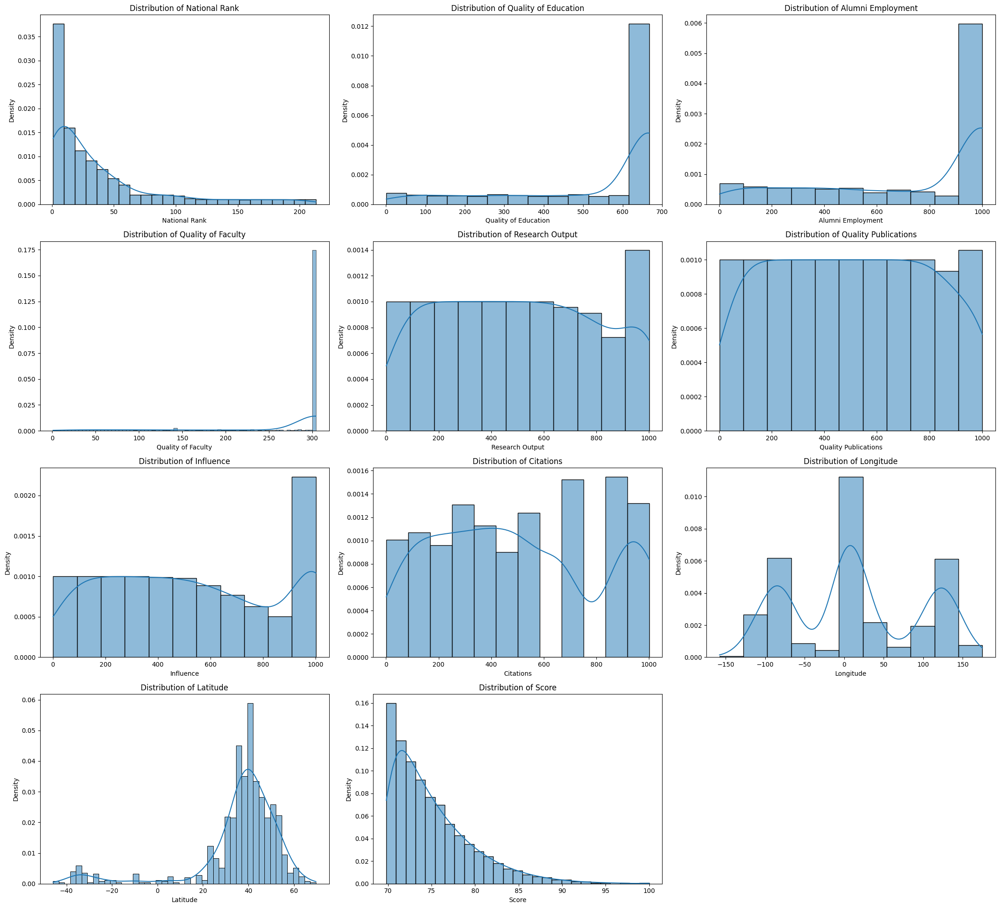

In [29]:
#histplot with density estimate line
plt.figure(figsize=(22, 20))
for i, feature in enumerate(features):
    plt.subplot(4, 3, i+1)
    sns.histplot(df[feature], stat="density", kde=True)
    plt.title(f"Distribution of {feature}")
    
plt.tight_layout()

plt.show()

Text(0.5, 1.0, 'Correlation Matrix')

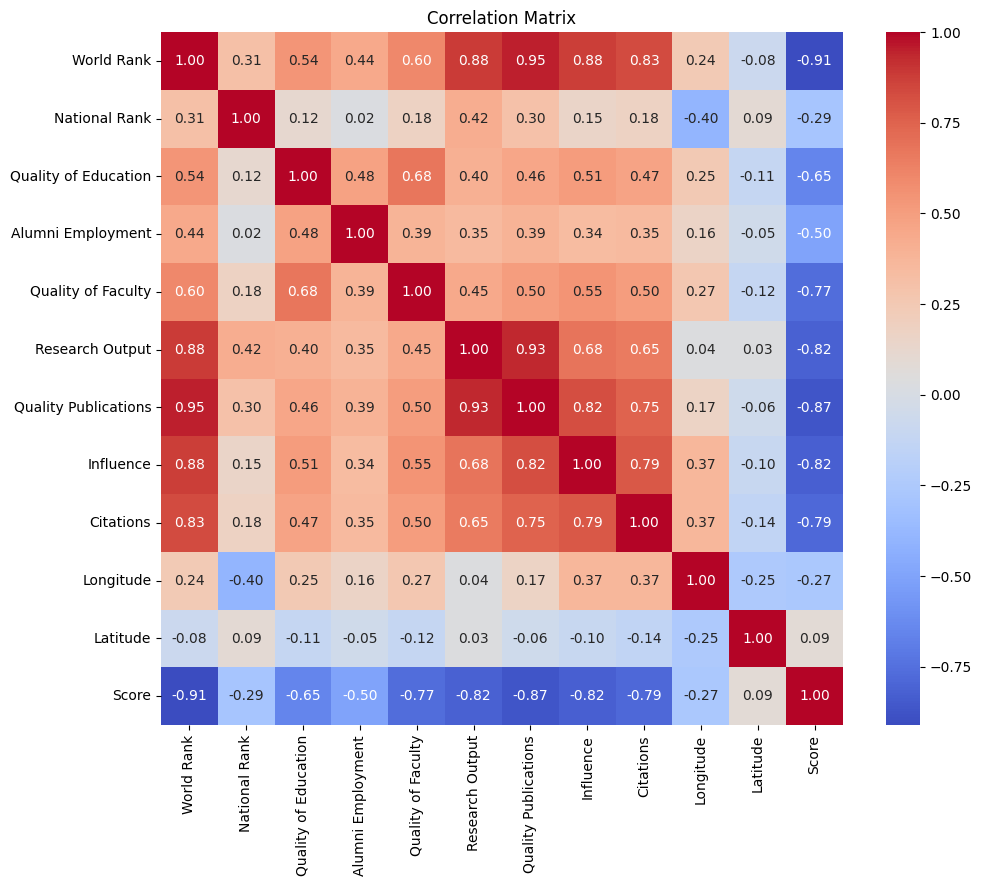

In [30]:
plt.figure(figsize=(11,9))
sns.heatmap(df.drop(columns=['Institution','Location','Country','Continent']).corr(),cmap='coolwarm',  annot=True, fmt=".2f")

plt.title('Correlation Matrix')

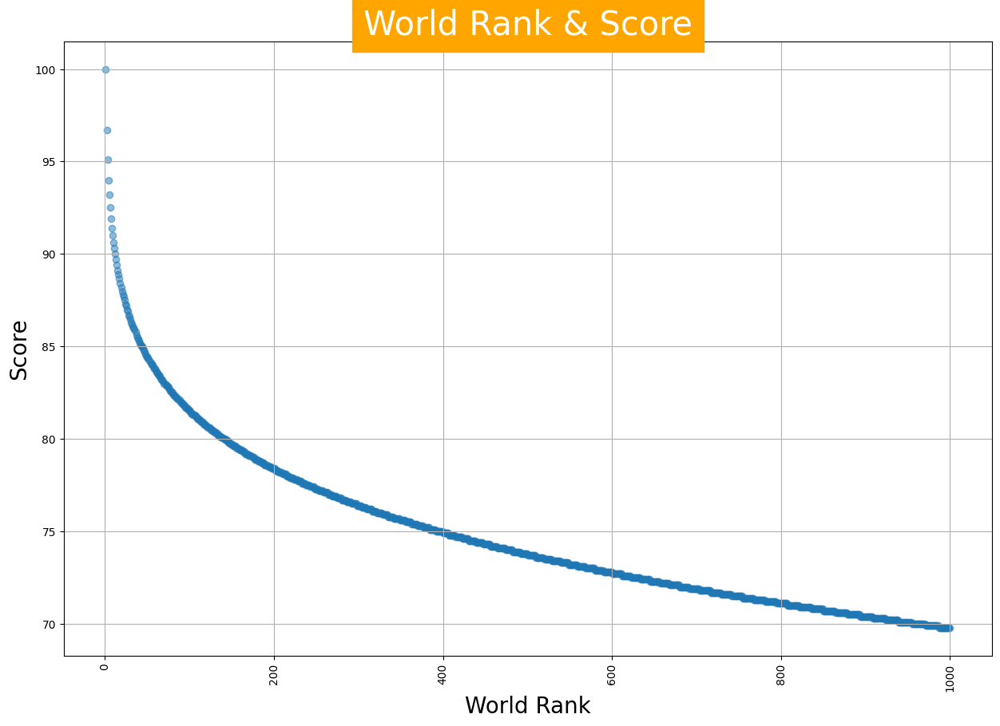

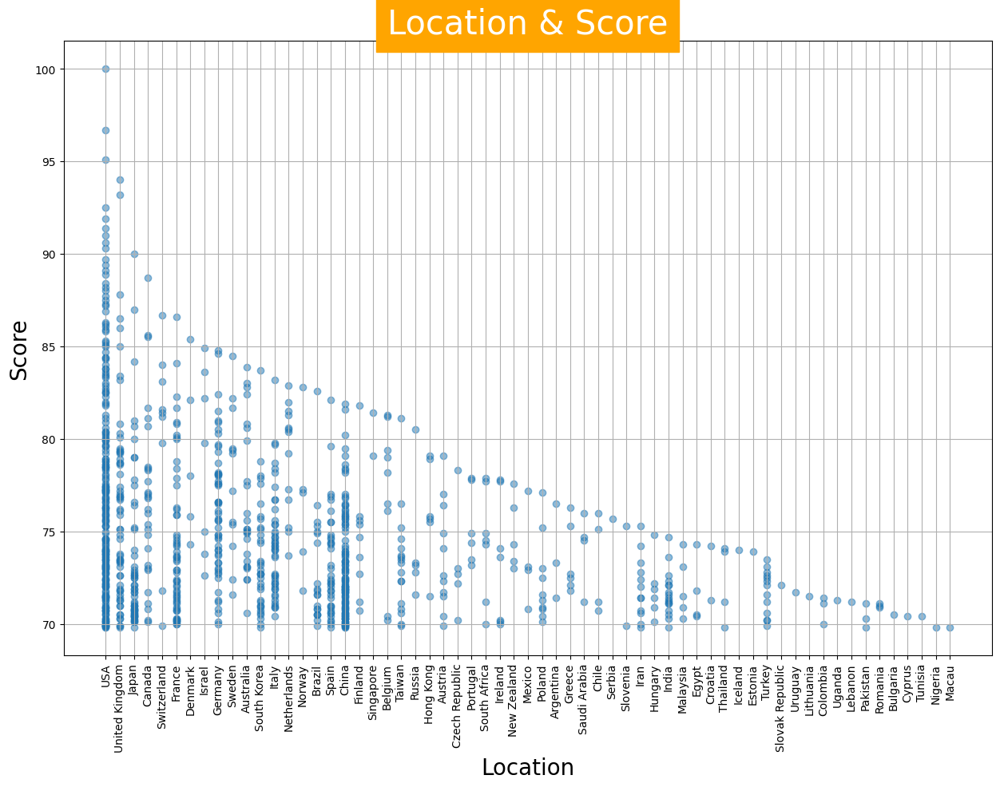

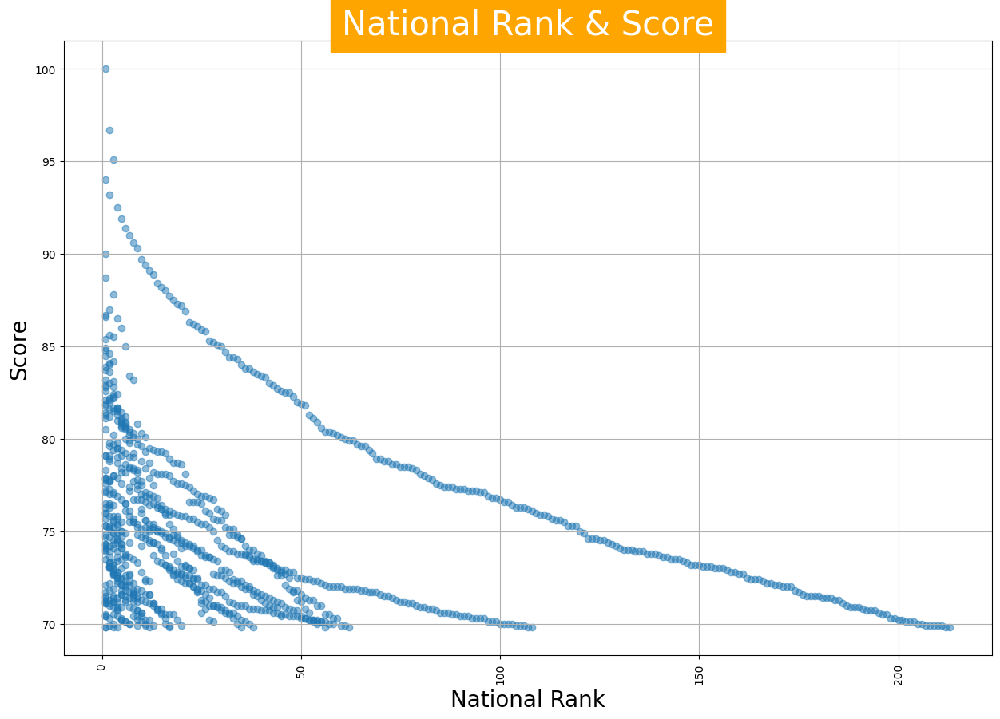

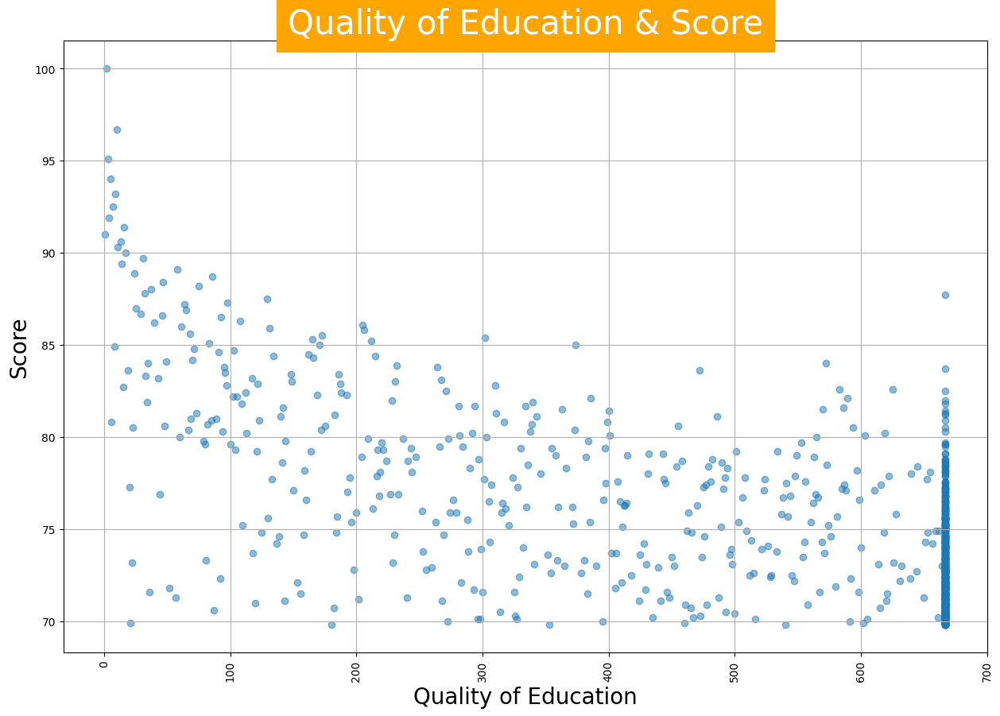

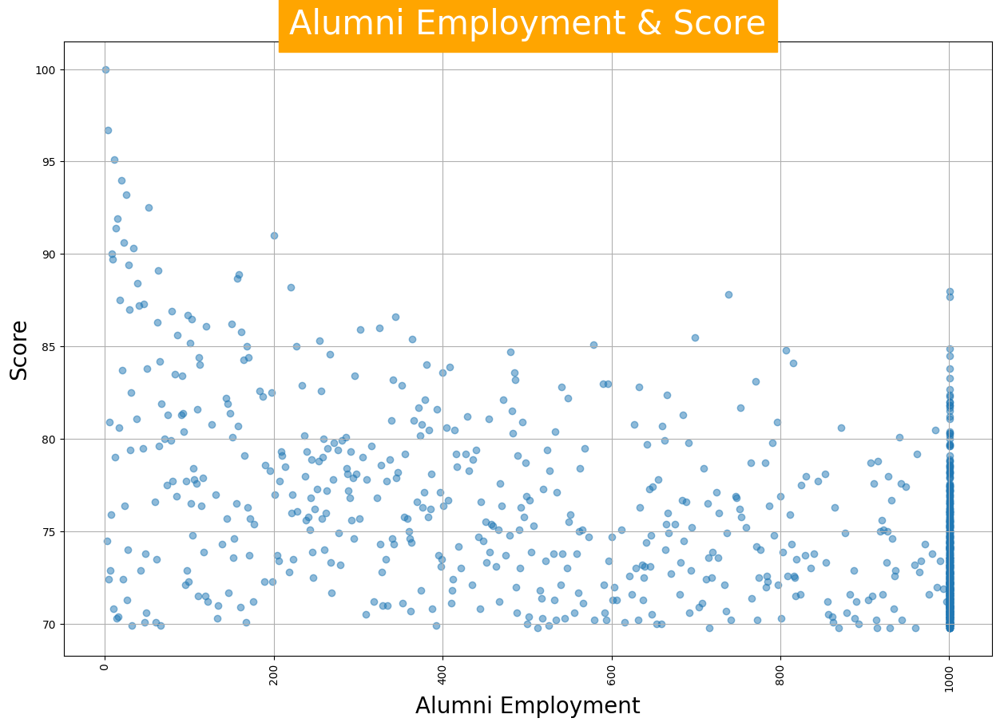

...

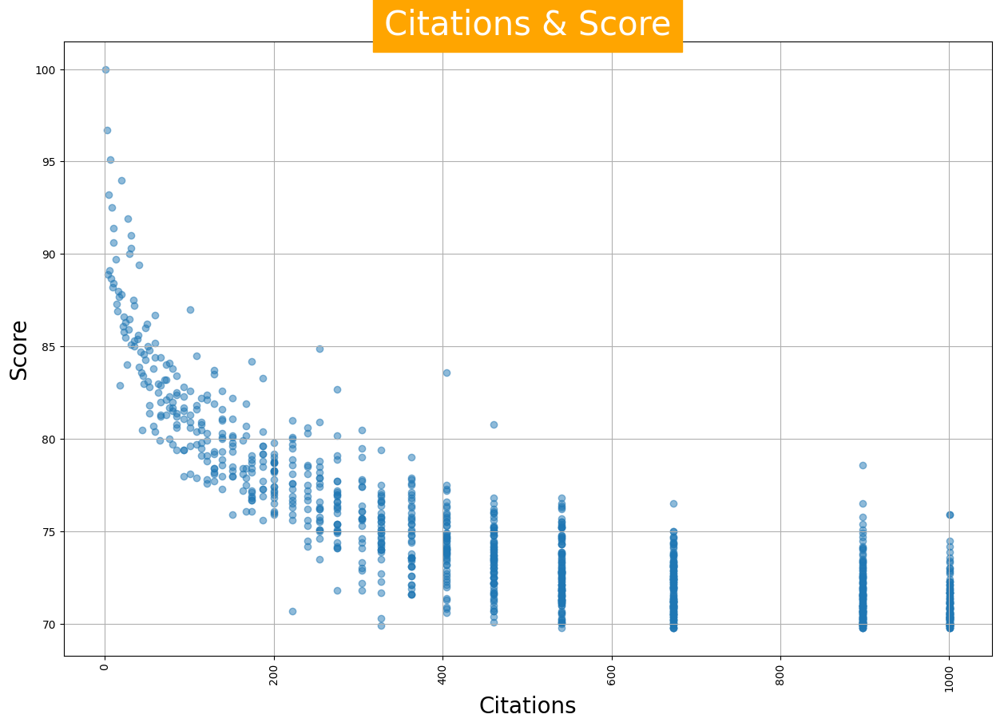

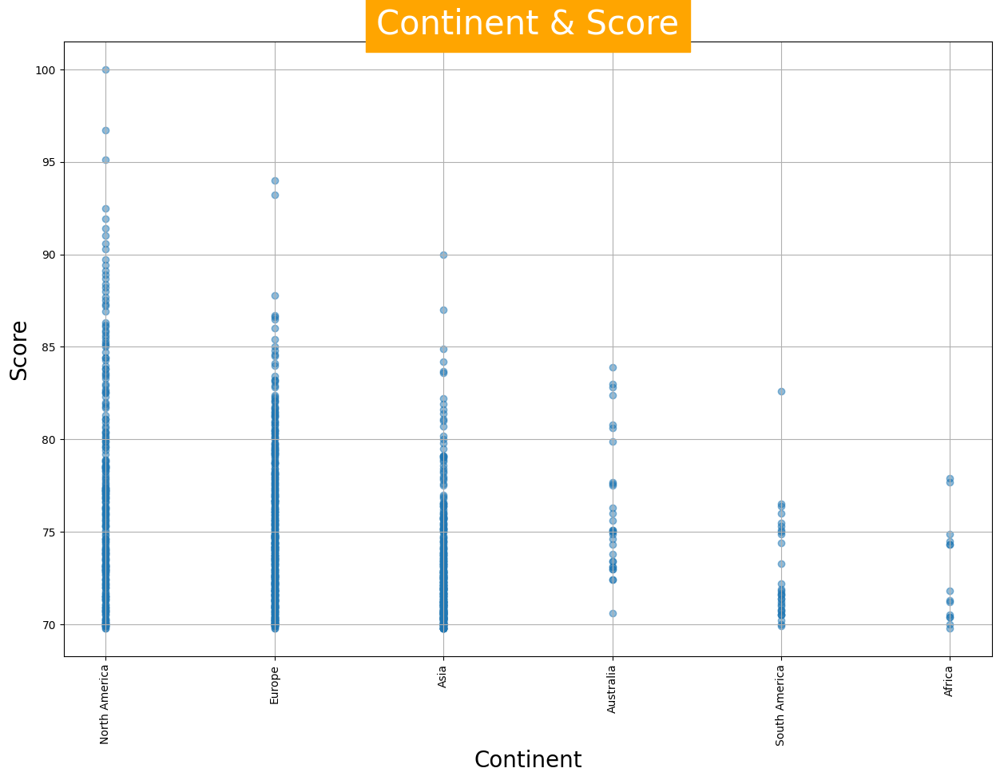

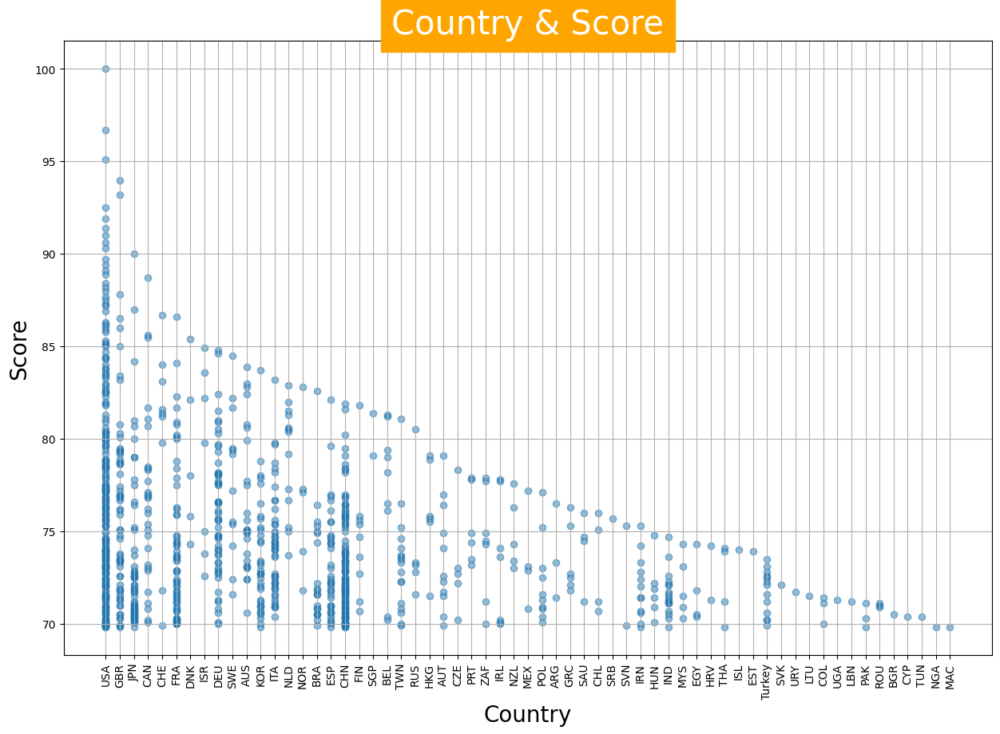

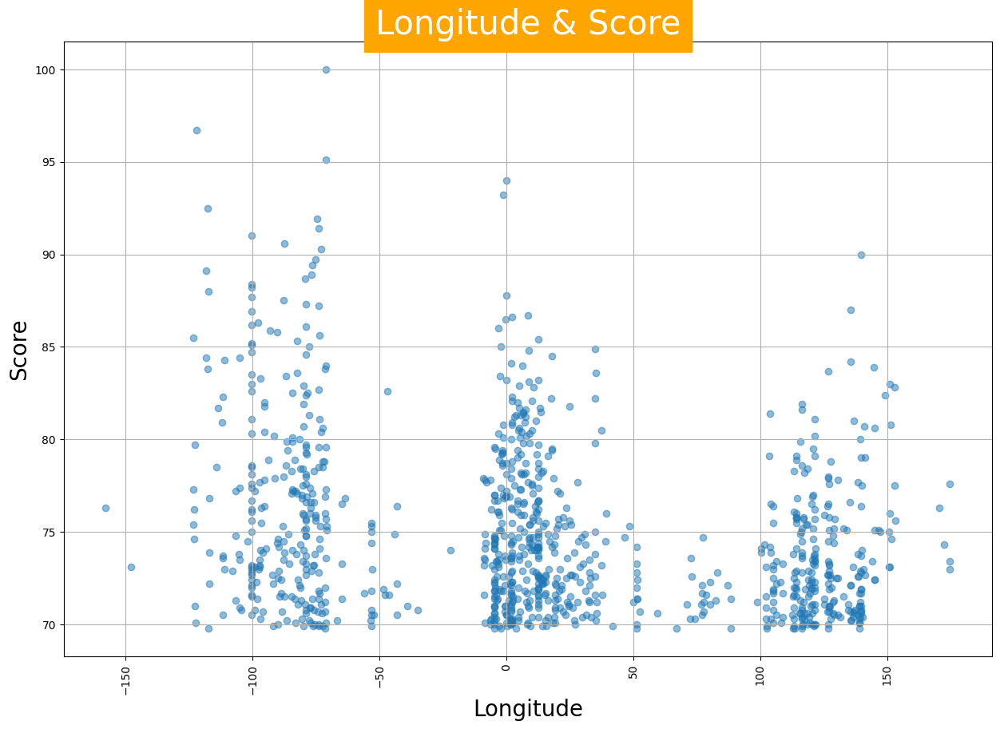

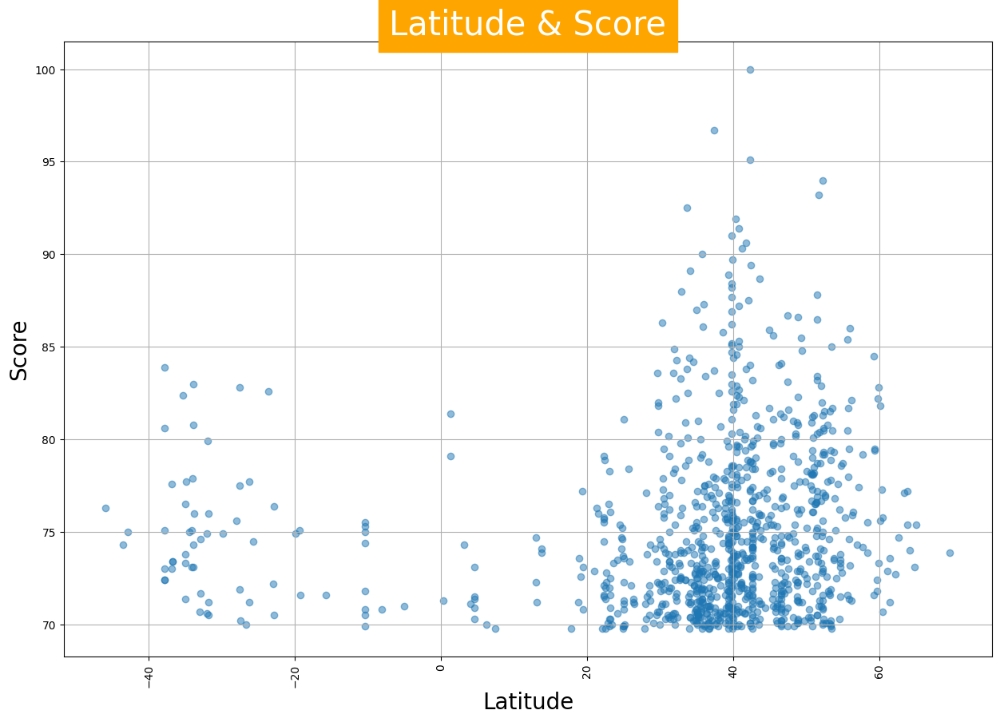

In [31]:
#Scatter plot between all features and score "except Institution".
for column in df.drop(columns=['Score',"Institution",]).columns : 
    plt.figure(figsize=(15,10))
    plt.scatter(df[column],df.Score , alpha=.5 )
    plt.title(column+" & Score",backgroundcolor='orange',color='white',fontsize=30)
    plt.xticks(rotation=90)
    plt.xlabel(column,fontsize=20)
    plt.ylabel("Score",fontsize=20)
    plt.grid()
    plt.show()

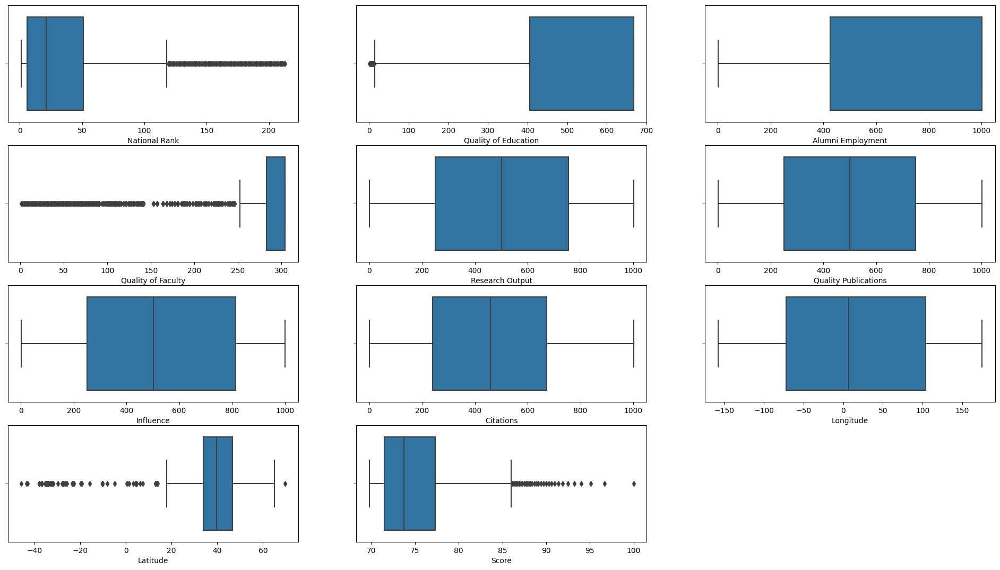

In [32]:
plt.figure(figsize=(24,20))
for i in enumerate(features):
    plt.subplot(6,3,i[0]+1)
    sns.boxplot(x= i[1], data = df)

In [33]:
#make new dataframe of the first 100 World Rank 
df_100=df[df["World Rank"]<=100] 

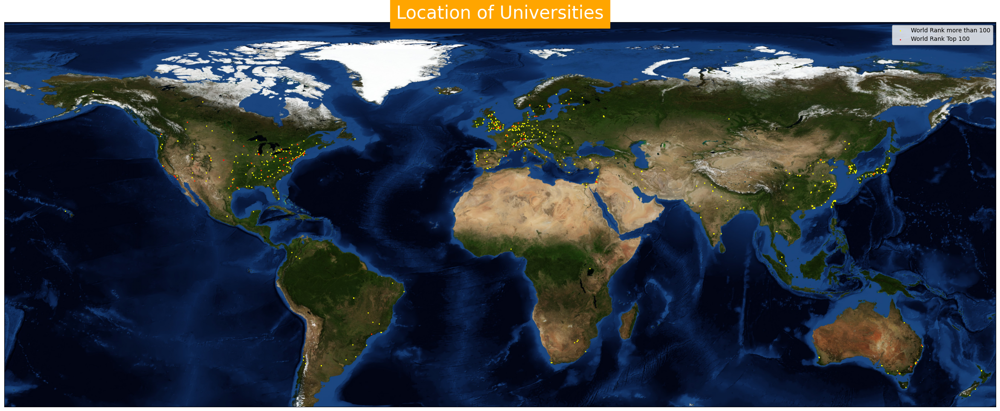

In [34]:
#Map plot
plt.figure(figsize=(30,30)) 
m = Basemap(projection='cyl',llcrnrlat=-50,urcrnrlat=90,llcrnrlon=-180,urcrnrlon=180,lat_ts=90,resolution='c') 
m.bluemarble() 
plt.scatter(df['Longitude'],df['Latitude'],1,marker='o',color='yellow',label='World Rank more than 100') 
plt.scatter(df_100['Longitude'],df_100['Latitude'],1,marker='o',color='Red',label='World Rank Top 100')
plt.title("Location of Universities",backgroundcolor='orange',color='white',fontsize=30)
plt.legend()
plt.show()

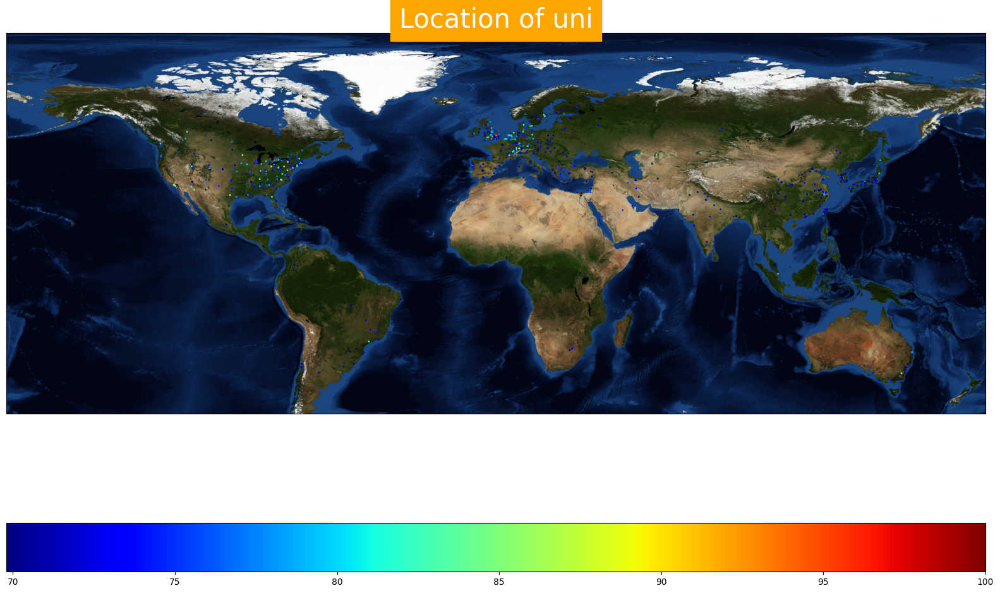

In [35]:
#Map plot
plt.figure(figsize=(20,15)) 
m = Basemap(projection='cyl',llcrnrlat=-50,urcrnrlat=90,llcrnrlon=-180,urcrnrlon=180,lat_ts=90,resolution='c')
m.bluemarble()
plt.scatter(df['Longitude'],df['Latitude'],1,marker='o',c=df["Score"],cmap="jet")
plt.title("Location of uni",backgroundcolor='orange',color='white',fontsize=30)
plt.colorbar(location ='bottom')
plt.show()

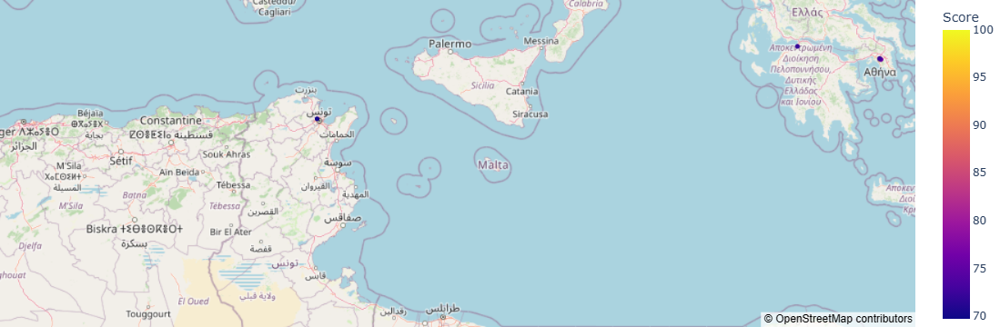

In [36]:
#Map plot
fig = px.scatter_mapbox(df, lat='Latitude', lon='Longitude', hover_name='Institution',color=df["Score"],
                        hover_data=["Continent","World Rank", "Score"],zoom=5,
                        mapbox_style="open-street-map")
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [37]:
df_count= pd.DataFrame({'Location':df.Location.value_counts().index,
                        'Country':df.Country.value_counts().values,
                        'Count':df.Country.value_counts().values})

In [38]:
#Calculate the percentage
df_count["Percentage"]=df_count['Count']/10
df_count

,Location,Country,Count,Percentage
0,USA,213,213,21.3
1,China,108,108,10.8
2,United Kingdom,62,62,6.2
3,France,58,58,5.8
4,Japan,56,56,5.6
...,...,...,...,...
56,Uruguay,1,1,0.1
57,Slovak Republic,1,1,0.1
58,Estonia,1,1,0.1
59,Iceland,1,1,0.1


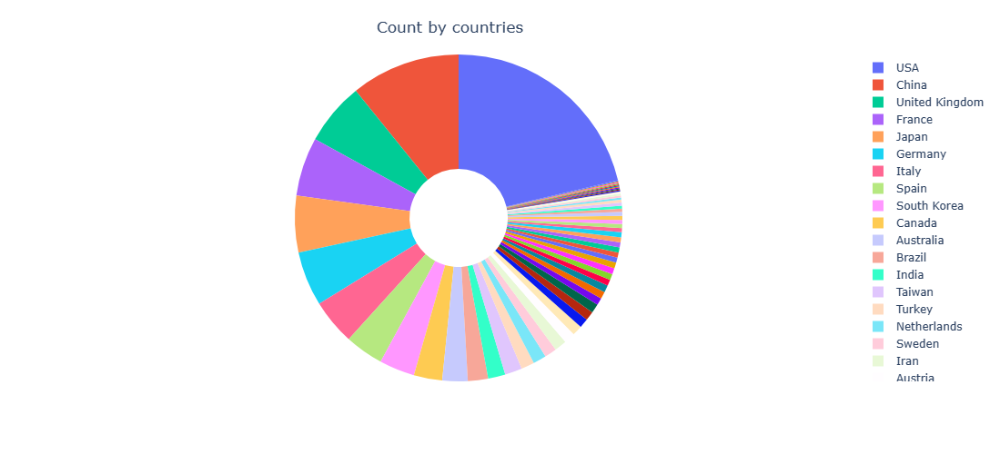

In [43]:
#Pie plot
labels = df_count.Location
values = df_count.Country

fig = px.pie(values=values,  
             names=labels,
             hole=0.3)

fig.update_traces(textinfo='none')  # Remove percentage labels

fig.update_layout(
    width=1000, height=500,
    title_text="Count by countries",
    title_x=0.45, 
    title_yanchor="middle"
)

fig.show()

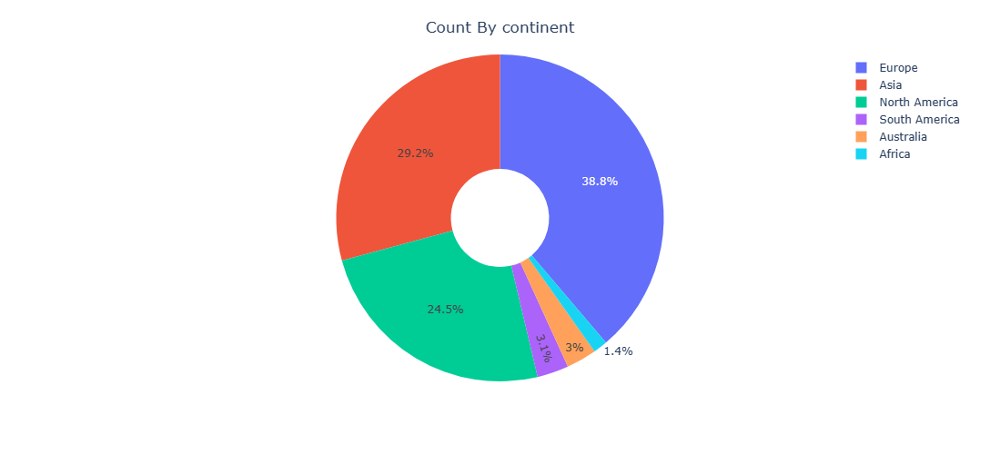

In [44]:
#Pie plot
labels = df.Continent.value_counts().index
values = df.Continent.value_counts().values

fig = px.pie(values=values,  
             names=labels,
             hole=0.3)


fig.update_layout(
    width=1000, height=500,
    title_text="Count By continent",
    title_x=0.50, 
    title_yanchor="middle"
)

fig.show()